In [1]:
import xarray as xr
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from pathlib import Path
from tqdm import tqdm

import scienceplots

plt.style.use(['science'])

c:\Python311\Lib\site-packages\numpy\_distributor_init.py:30: UserWarning: loaded more than 1 DLL from .libs:
c:\Python311\Lib\site-packages\numpy\.libs\libopenblas64__v0.3.21-gcc_10_3_0.dll
c:\Python311\Lib\site-packages\numpy\.libs\libopenblas64__v0.3.23-gcc_10_3_0.dll
  warnings.warn("loaded more than 1 DLL from .libs:"


In [7]:
d

<xarray.Dataset>
Dimensions:     (lats: 180, lons: 360)
Coordinates:
    Longitude   (lats, lons) float64 ...
    Latitude    (lats, lons) float64 ...
    time        datetime64[ns] ...
Dimensions without coordinates: lats, lons
Data variables:
    sla         (lats, lons) float64 ...
    sst         (lats, lons) float64 ...
    swh         (lats, lons) float64 ...
    wind_speed  (lats, lons) float64 ...
Attributes: (12/13)
    Conventions:           CF-1.7
    title:                 RADS 4 pass file
    institution:           EUMETSAT / NOAA / TU Delft
    source:                radar altimeter
    references:            RADS Data Manual, Version 4.2 or later
    featureType:           trajectory
    ...                    ...
    ellipsoid_axis:        6378136.3
    ellipsoid_flattening:  0.0033528131778969143
    mission_name:          ['TOPEX', 'ERS-1']
    mission_phase:         a
    n_points:              [44174 45227]
    total_points:          89401

In [3]:
pathv5=Path(r"C:\Users\mathi\Danmarks Tekniske Universitet\Casper Tygesen Bang-Hansen - ProcessedGrids\Processed_v5_v02")
pathv6=Path(r"C:\Users\mathi\Danmarks Tekniske Universitet\Casper Tygesen Bang-Hansen - ProcessedGrids\Processed_v6_v01")
globlistv5 = list(pathv5.glob("*.nc"))
globlistv6 = list(pathv6.glob("*.nc"))
v6_names = [file.name for file in globlistv6]

mean_all, mean_mid, times = [],[],[]
print("loading data...")
for file in tqdm(globlistv5):
    if file.name in v6_names:
        file = pathv6/file.name
    d=xr.open_dataset(file,engine="netcdf4")

    mean_all.append(d.sla.mean(dim="time").item())
    times.append(d.time[0].dt.date.item())
    mean_mid.append(d.sla[(np.abs(d.lat) < 60)].mean(dim="time").item())


loading data...


  0%|          | 0/10994 [00:00<?, ?it/s]


ValueError: 'time' not found in array dimensions ('lats', 'lons')

In [ ]:
mean_all = np.array(mean_all)
times = np.array(times)
mean_mid = np.array(mean_mid)

In [ ]:
idx = np.arange(len(times),dtype=int)
sla = mean_all
G = np.hstack([np.ones(len(sla)).reshape(-1,1), idx.reshape(-1,1)])
m = np.linalg.lstsq(G, sla, rcond = None)[0]
d_all = G @ m

corrected_sla_all = sla - d_all

In [ ]:
sla = mean_mid
G = np.hstack([np.ones(len(sla)).reshape(-1,1), idx.reshape(-1,1)])
m = np.linalg.lstsq(G, sla, rcond = None)[0]
d_mid = G @ m

corrected_sla_mid = sla - d_mid

In [ ]:
i = idx[times < np.datetime64("1993-01-01")]
sla_all_before_1993 = corrected_sla_all[i]
sla_mid_before_1993 = corrected_sla_mid[i]
j = idx[times >= np.datetime64("1993-01-01")]
sla_all_after_1993 = corrected_sla_all[j]
sla_mid_after_1993 = corrected_sla_mid[j]

In [ ]:
print(f"All before 1993: {sla_all_before_1993.std()}")
print(f"All after 1993: {sla_all_after_1993.std()}")
print(f"-60 to 60 before 1993: {sla_mid_before_1993.std()}")
print(f"-60 to 60 after 1993: {sla_mid_after_1993.std()}")

All before 1993: 0.017786567002039476
All after 1993: 0.009045151190966808
-60 to 60 before 1993: 0.01709689951966657
-60 to 60 after 1993: 0.008136879429439036


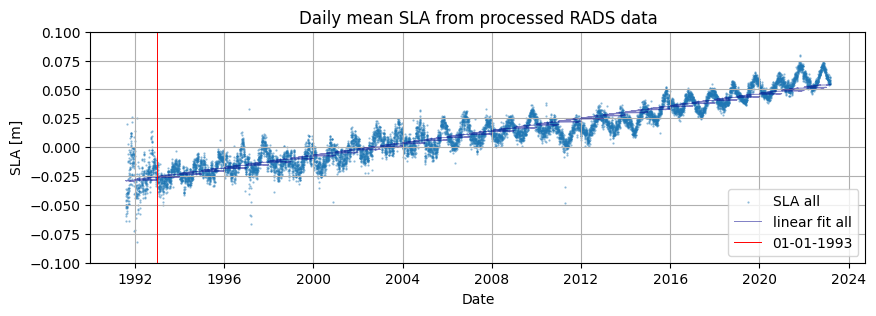

In [ ]:
plt.figure(figsize=(10,3))
plt.scatter(times, mean_all, s=0.3, label="SLA all", alpha=0.5)
plt.plot(times,d_all,linewidth=.7,c="darkblue",label="linear fit all", alpha=0.5)
# plt.scatter(times, mean_mid, s=0.3, label="SLA +/-60 lat", alpha=0.5)
# plt.plot(times,d_mid,linewidth=.7,c="red", label="linear fit +/-60 lat", alpha=0.5)
plt.axvline(np.datetime64("1993-01-01"),c="r",linewidth=0.7,label="01-01-1993")
plt.xlabel("Date")
plt.ylabel("SLA [m]")
plt.title("Daily mean SLA from processed RADS data")
plt.grid()
plt.ylim([-0.1,0.1])
plt.legend()
plt.show()

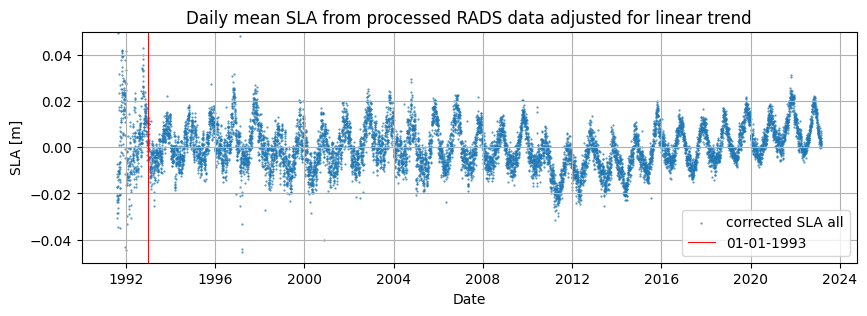

In [ ]:
plt.figure(figsize=(10,3))
plt.scatter(times, corrected_sla_all, s=0.3, label="corrected SLA all", alpha=0.8)
# plt.scatter(times, corrected_sla_mid, s=0.3, label="corrected SLA +/- 60 lat", alpha=0.8)
plt.axvline(np.datetime64("1993-01-01"),c="r",linewidth=0.7,label="01-01-1993")
plt.xlabel("Date")
plt.ylabel("SLA [m]")
plt.title("Daily mean SLA from processed RADS data adjusted for linear trend")
plt.grid()
plt.ylim([-0.05,0.05])
plt.legend()
plt.show()

AttributeError: 'numpy.ndarray' object has no attribute 'data_vars'

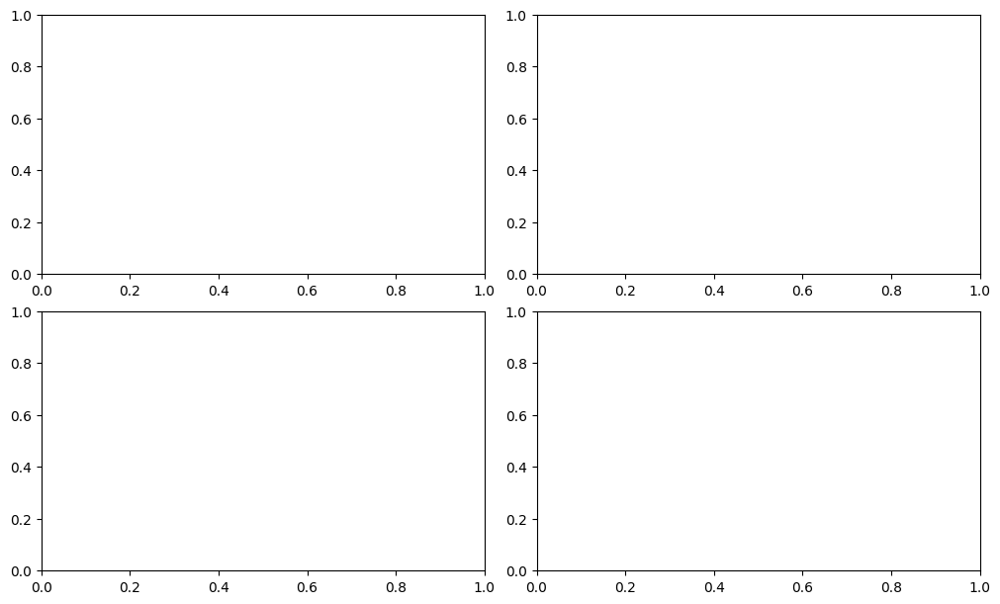

In [ ]:
fig,axes = plt.subplots(2,2,figsize=(10,6), constrained_layout=True)
for (var,ax) in zip(list(corrected_sla.data_vars),axes.flatten()):
    ax.scatter(corrected_sla.time, corrected_sla[var], s=0.3)
    ax.set_xlabel("Date")
    ax.set_ylabel(f"{var}")
    ax.set_title(var)
    ax.grid()
plt.show()
    

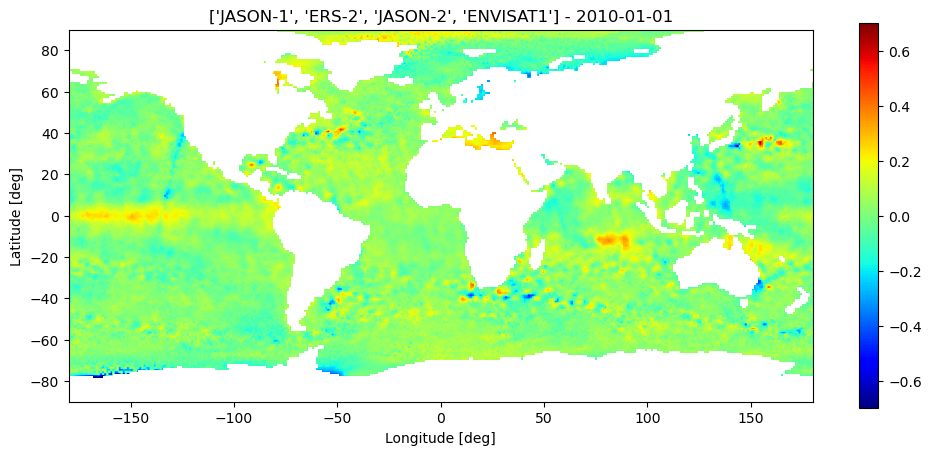

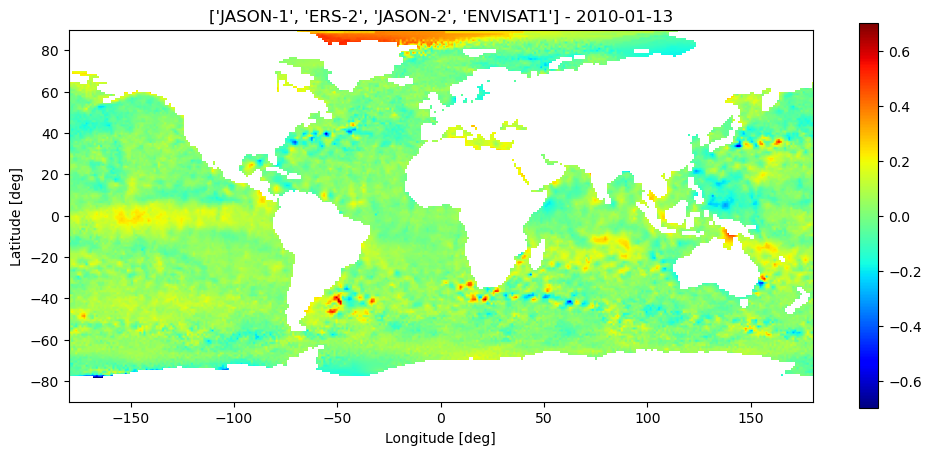

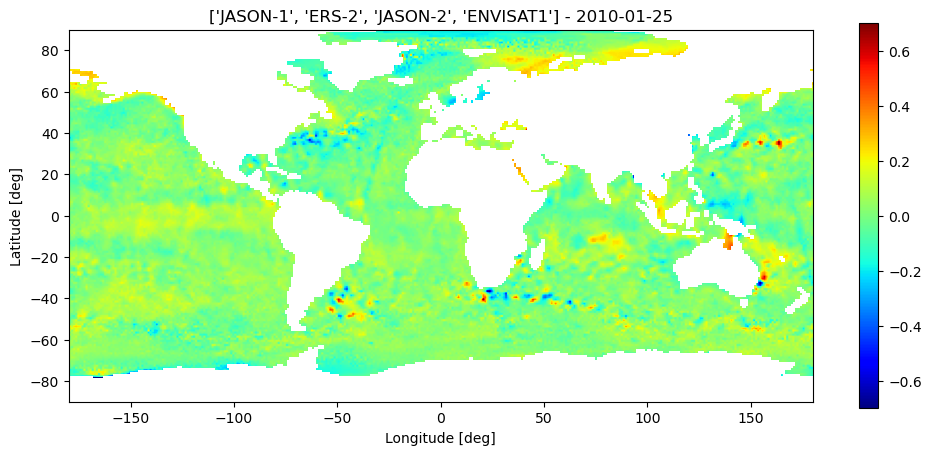

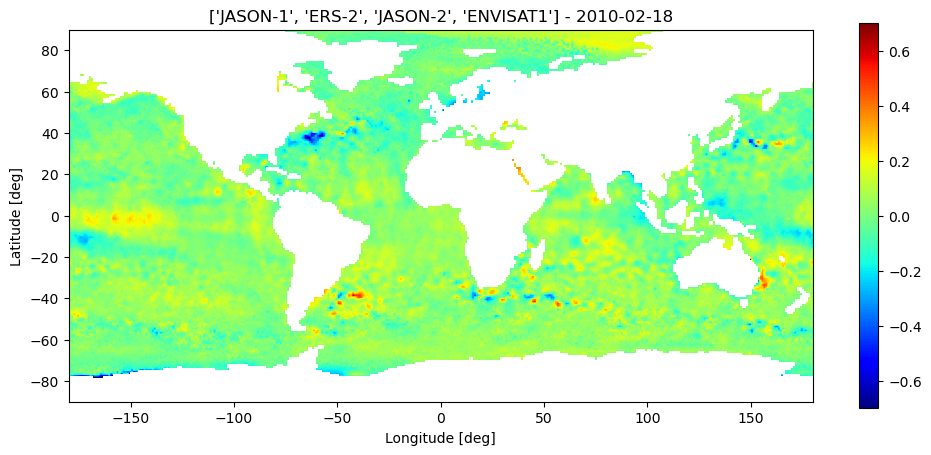

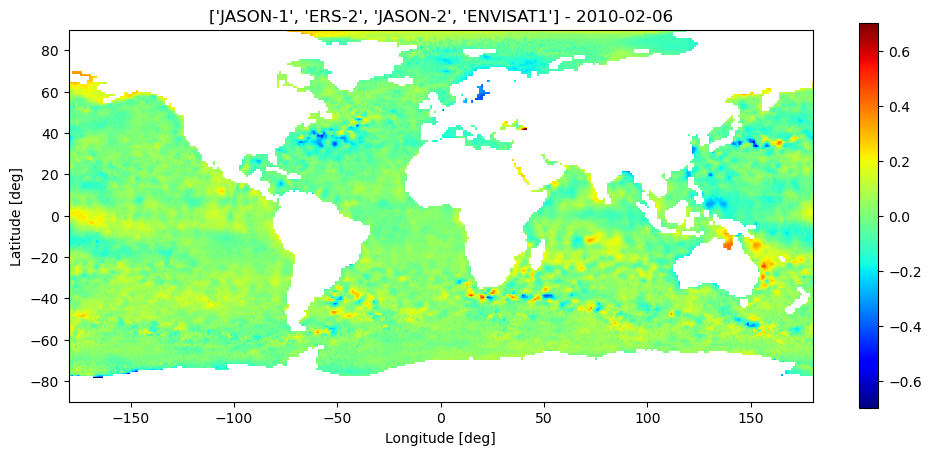

...

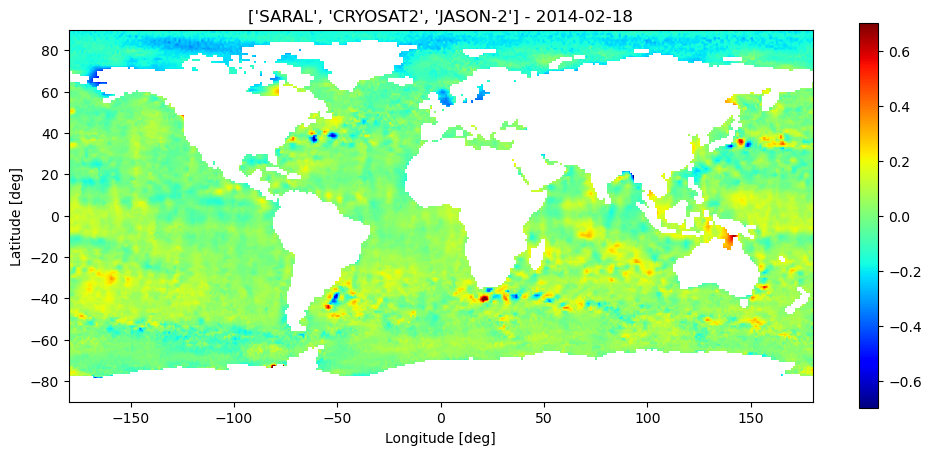

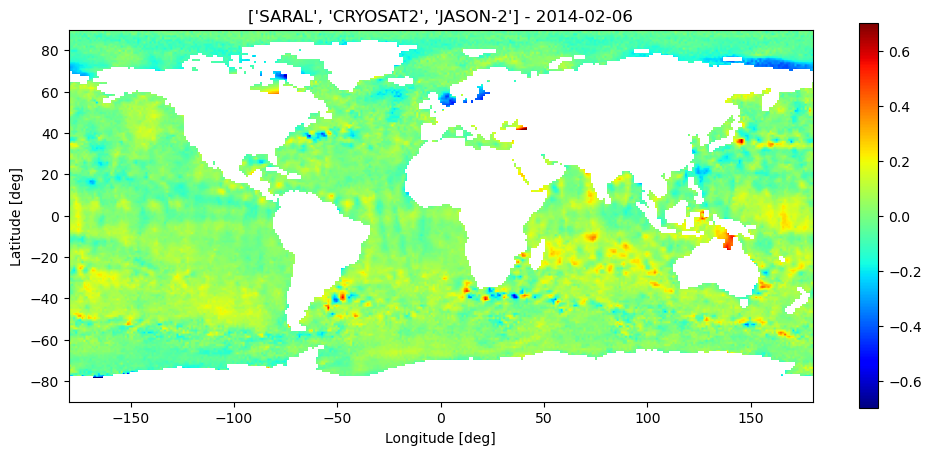

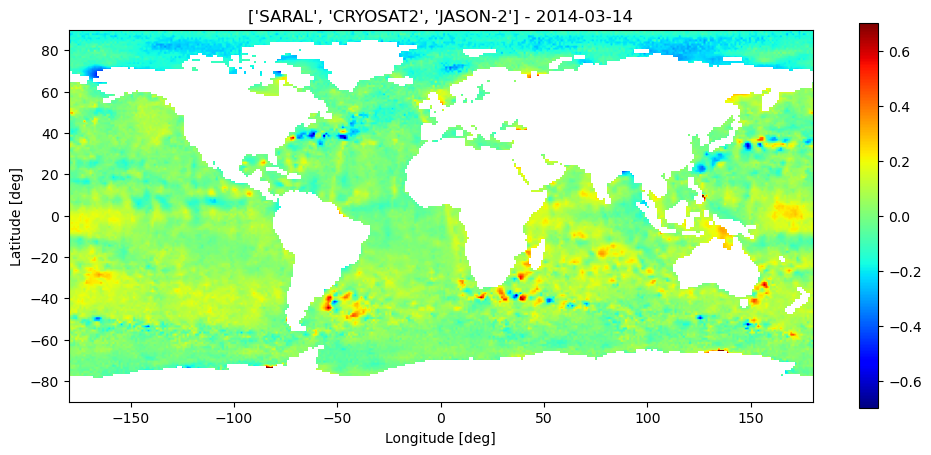

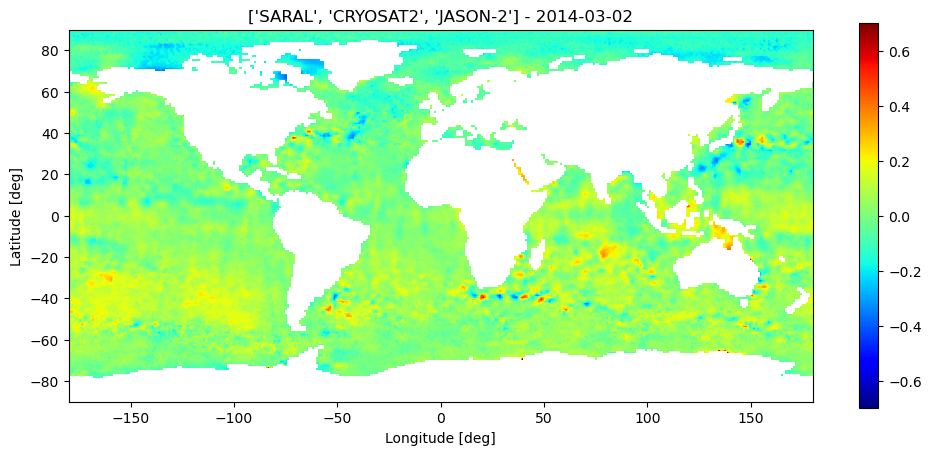

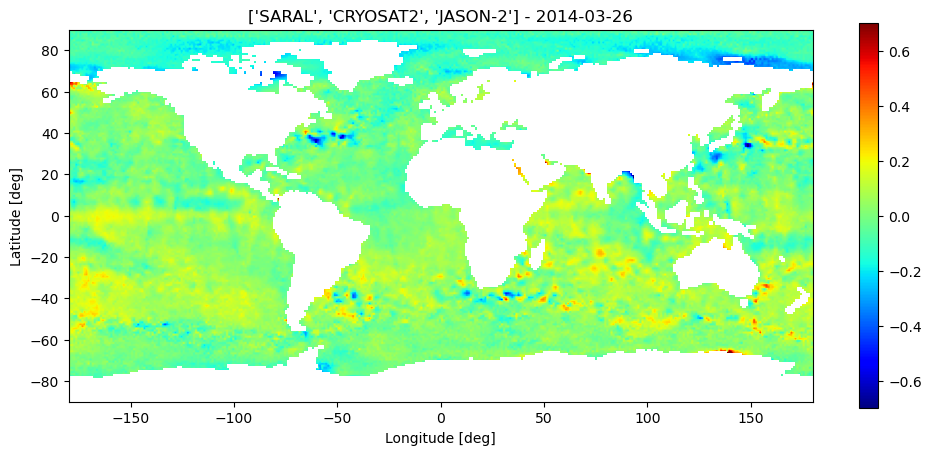

In [ ]:
path = Path("Grids/Processed_v4_haversine")
for file in path.glob("*.nc"):
    data = xr.open_dataset(file, engine="netcdf4")
    plt.figure(figsize=(12,5))
    plt.imshow(data.sla, origin="lower", extent=(-180,180,-90,90), cmap="jet", vmin=-.7, vmax=.7)
    plt.xlabel("Longitude [deg]")
    plt.ylabel("Latitude [deg]")
    sats = data.attrs["mission_name"]
    day = data.time.dt.date.astype("str").values
    plt.title(f"{sats} - {day}")
    plt.colorbar()
    plt.show()